In [1]:
# Data Manipulation
import pandas as pd 
import numpy as np 

# Data visualization
import matplotlib.pyplot as plt 
import seaborn as sns 

# Network analytics
import networkx as nx

# Preferences
pd.set_option('display.max_columns', None)
from IPython.display import clear_output, display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## List of metrics to test each 
- Centrality: degree, eigenvector, Katz, PageRank, HITS, closeness, betweenness, flow betweenness, random-walk betweenness (9 metrics)
- Groups of Nodes: cliques, cores, k-components (not a great fit) (3 metrics)
- Transitivity, local clustering / redundancy (2 metrics)
- Structural balance (local), structural holes (2 metrics)
- Similarity: Structural equivalence, regular equivalence (2 metrics)
- Homophily & Assortative Mixing: unordered characteristics, ordered characteristics, by degree (3 metrics)

In [23]:
raw_cite_data = pd.read_csv("../data/02_intermediate/citation_matrix_using_contains.csv")
data = raw_cite_data.copy()
# data.describe()

In [37]:
# ENSURE CITATION MATRIX IS A SQUARE MATRIX

# Set the first column as the index
df = data.copy()
df = df.set_index('article_title')

# Create a square matrix by making sure both the index and columns match
common_titles = set(df.index).intersection(df.columns)
df = df.loc[common_titles, common_titles]

# Check for duplicate row indices
duplicate_indices = df.index[df.index.duplicated(keep=False)]

# Remove duplicate indices keeping the first
df = df[~df.index.duplicated(keep='first')]

# Verify the shape
df.shape

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_52258/3711841860.py:9: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df = df.loc[common_titles, common_titles]


(9334, 9334)

# Visualizing the network

In [38]:
# Convert DataFrame to numpy array for NetworkX
matrix = df.to_numpy()

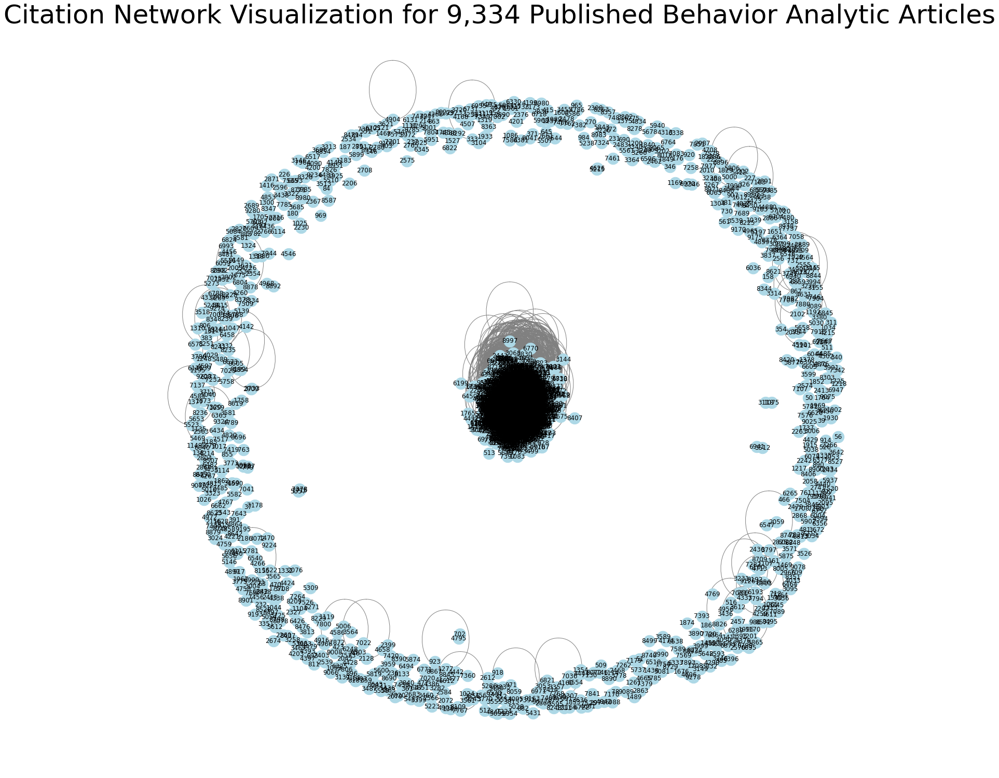

In [41]:
# Create a graph from the adjacency matrix
G = nx.from_numpy_matrix(matrix)

# Draw the network
plt.figure(figsize=(20, 20))
nx.draw(G, with_labels=True, node_color='lightblue', edge_color='gray', node_size=500)
plt.title("Citation Network Visualization for 9,334 Published Behavior Analytic Articles", fontsize=50)
plt.show()

In [50]:
# Read in the raw data so we can get a dict of the articles and their respective journal
raw_data = pd.read_csv("../data/02_intermediate/raw_data_cleaned_for_citation_matrix.csv")
raw_data = raw_data.drop(['Unnamed: 0'], axis=1)
journal_dict = dict(zip(raw_data['article_title'], raw_data['journal']))

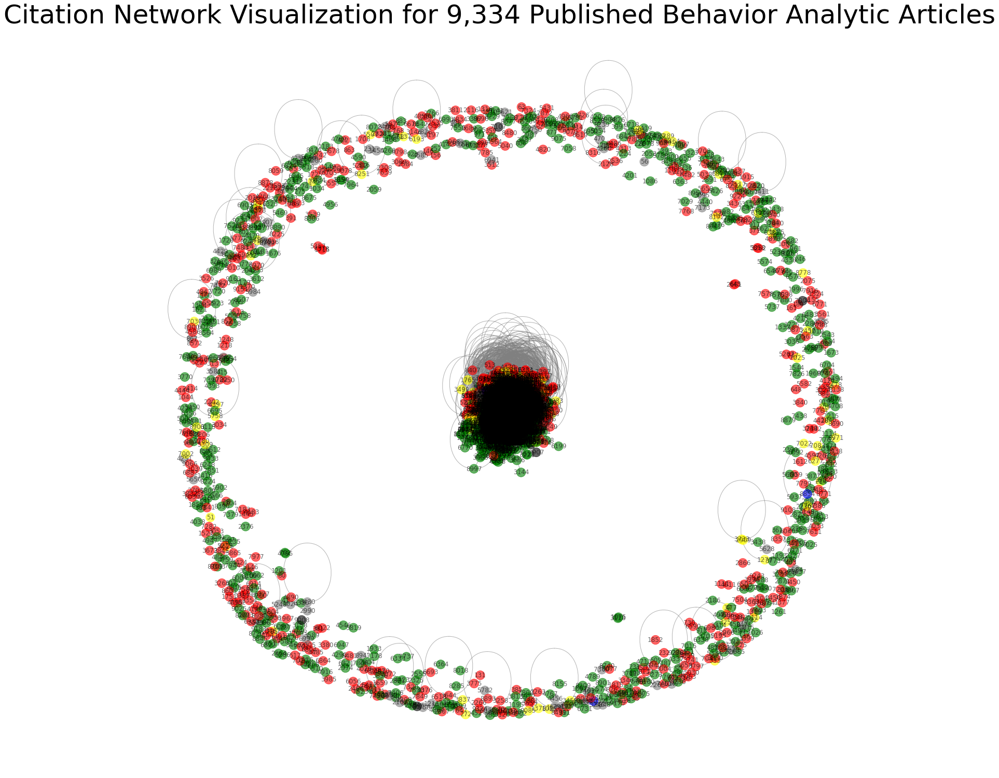

In [64]:
import networkx as nx
import matplotlib.pyplot as plt

# Color the nodes based on journal
label_color_dict = {
    'TAVB': 'blue',
    'BAP': 'yellow',
    'JABA': 'red',
    'JEAB': 'green',
    'PoBS': 'black',
}

# Add journal label to the matrix df for coloring
df['label'] = df.index.map(journal_dict)

# Create a graph from the adjacency matrix
matrix = df.drop(['label'], axis=1).to_numpy()
G = nx.from_numpy_matrix(matrix)

# Create a mapping from article titles to colors based on the journal
article_color_mapping = {row['article_title']: label_color_dict.get(row['journal'], 'gray') for _, row in raw_data.iterrows()}

# Map node labels to colors using the 'article_color_mapping'
node_colors = [article_color_mapping.get(node_labels[node], 'gray') for node in G.nodes]

# Decrease node size and add transparency
node_size = 300  # Adjust the node size as needed
alpha = 0.6      # Adjust the transparency (0.0 to 1.0, where 0.0 is fully transparent)

# Draw the network with adjusted node size and transparency
plt.figure(figsize=(20, 20))
nx.draw(G, with_labels=True, node_color=node_colors, edge_color='gray', node_size=node_size, alpha=alpha)
plt.title("Citation Network Visualization for 9,334 Published Behavior Analytic Articles", fontsize=50)
plt.show()

In [68]:
import plotly.graph_objects as go

# Create a mapping from article titles to colors based on the journal
article_color_mapping = {row['article_title']: label_color_dict.get(row['journal'], 'gray') for _, row in raw_data.iterrows()}

# Map node labels to colors using the 'article_color_mapping'
node_colors = [article_color_mapping.get(node_labels[node], 'gray') for node in G.nodes]

# Define node positions in 3D
pos_3d = nx.spring_layout(G, dim=3)

# Extract X, Y, and Z coordinates for nodes
Xn = [pos_3d[node][0] for node in G.nodes]
Yn = [pos_3d[node][1] for node in G.nodes]
Zn = [pos_3d[node][2] for node in G.nodes]

# Create a Plotly 3D scatter plot for nodes
trace_nodes = go.Scatter3d(
    x=Xn,
    y=Yn,
    z=Zn,
    mode='markers',
    marker=dict(size=5, color=node_colors, opacity=0.6),
    text=list(G.nodes),
)

# Create a list of edges as pairs of node indices
edges = list(G.edges())

# Extract X, Y, and Z coordinates for edge lines
Xe = []
Ye = []
Ze = []
for edge in edges:
    Xe += [pos_3d[edge[0]][0], pos_3d[edge[1]][0], None]
    Ye += [pos_3d[edge[0]][1], pos_3d[edge[1]][1], None]
    Ze += [pos_3d[edge[0]][2], pos_3d[edge[1]][2], None]

# Create a Plotly 3D scatter plot for edges
trace_edges = go.Scatter3d(
    x=Xe,
    y=Ye,
    z=Ze,
    mode='lines',
    line=dict(color='gray', width=0.1),
)

# Create a Plotly layout
layout = go.Layout(
    scene=dict(
        xaxis=dict(title='X Axis Title'),
        yaxis=dict(title='Y Axis Title'),
        zaxis=dict(title='Z Axis Title'),
    ),
    margin=dict(l=0, r=0, b=0, t=0),
)

# Create a Plotly figure with nodes and edges
fig = go.Figure(data=[trace_nodes, trace_edges], layout=layout)

# Show the interactive 3D plot
fig.show()

# Centrality metrics

In [ ]:
# Degree Centrality
degree_centrality = nx.degree_centrality(G)

# Eigenvector Centrality
eigenvector_centrality = nx.eigenvector_centrality(G)

# Katz Centrality
katz_centrality = nx.katz_centrality(G)

# PageRank
pagerank = nx.pagerank(G)

# HITS
hubs, authorities = nx.hits(G)

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G)

# Flow Betweenness Centrality (requires a weighted graph)
flow_betweenness_centrality = nx.current_flow_betweenness_centrality(G)

# Random-Walk Betweenness Centrality
random_walk_betweenness_centrality = nx.approximate_current_flow_betweenness_centrality(G)

# Groups of Nodes

In [ ]:
# Cliques
cliques = list(nx.find_cliques(G))

# Cores
cores = nx.core_number(G)

# K-Components (complex, might require additional settings)
k_components = nx.k_components(G)

# Transitivity and Clustering

In [ ]:
# Transitivity
transitivity = nx.transitivity(G)

# Local Clustering
local_clustering = nx.clustering(G)

# Similarity

In [ ]:
# Structural Equivalence (can be approximated through various measures like Jaccard similarity)
# Regular Equivalence (more complex, not directly supported by NetworkX)

# Homopphily and Assortative Mixing

In [ ]:
# For these, you'll need node attributes. Assuming you have them, you can use:
# nx.attribute_assortativity_coefficient(G, attribute)

# Assortativity by Degree
degree_assortativity = nx.degree_assortativity_coefficient(G)